In [1]:
# https://github.com/facebookresearch/detr

# Github 코드 참고 및 논문 공부와 같이 하면 더 좋습니다.

# Detection Transformer (DETR)

#### DETR 모델의 기본 지식
1. COCO val5K 이미지를 이용해 Pre-trained 모델을 있다.    
2. COCO panoptic val5K를 이미지를 이용한 Pre-trained 모델이 있다.
3. 

In [6]:
# COCO dataset 활용을 위한 다운
pip install git+https://github.com/cocodataset/panopticapi.git

  Cloning https://github.com/cocodataset/panopticapi.git to c:\users\admin\appdata\local\temp\pip-req-build-_87lvljv
  Resolved https://github.com/cocodataset/panopticapi.git to commit 7bb4655548f98f3fedc07bf37e9040a992b054b0
  Created wheel for panopticapi: filename=panopticapi-0.1-py3-none-any.whl size=9401 sha256=507919713a5d56176a24ceef9c532bc633213333ed6c5239babdb40884d7993b
  Stored in directory: C:\Users\Admin\AppData\Local\Temp\pip-ephem-wheel-cache-7kv5u2om\wheels\b3\fc\e3\2463e5db55087b06e9c3bb117af1a63a080d1ec4c33291cec9
Successfully built panopticapi
Note: you may need to restart the kernel to use updated packages.


  Running command git clone -q https://github.com/cocodataset/panopticapi.git 'C:\Users\Admin\AppData\Local\Temp\pip-req-build-_87lvljv'
You should consider upgrading via the 'C:\Users\Admin\anaconda3\envs\tensorflow2_py38\python.exe -m pip install --upgrade pip' command.


In [2]:
''' 1. Import Module '''
import os, sys
import random
import math
import numpy
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

from torchvision import datasets, transforms
from PIL import Image

In [3]:
torch.__version__

'1.8.0'

In [4]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device # CUDA

device(type='cuda')

In [5]:
torch.cuda.get_device_name(0)

'NVIDIA GeForce RTX 3070 Laptop GPU'

In [6]:
'''2. COCO dataset '''
import panopticapi
from panopticapi.utils import id2rgb, rgb2id

In [7]:
# These are the COCO classes
CLASSES = [
    'N/A', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A',
    'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse',
    'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack',
    'umbrella', 'N/A', 'N/A', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis',
    'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove',
    'skateboard', 'surfboard', 'tennis racket', 'bottle', 'N/A', 'wine glass',
    'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich',
    'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake',
    'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table', 'N/A',
    'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard',
    'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A',
    'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier',
    'toothbrush'
]

In [8]:
# Detectron2 uses a different numbering scheme
coco2d2 = {}
count = 0
for i,c in enumerate(CLASSES):
    if c != 'N/A':
        coco2d2[i] = c
        count += 1
        
# Image preprocessing
transform = transforms.Compose([
    transforms.Resize(800),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])


In [32]:
coco2d2.items()

dict_items([(1, 'person'), (2, 'bicycle'), (3, 'car'), (4, 'motorcycle'), (5, 'airplane'), (6, 'bus'), (7, 'train'), (8, 'truck'), (9, 'boat'), (10, 'traffic light'), (11, 'fire hydrant'), (13, 'stop sign'), (14, 'parking meter'), (15, 'bench'), (16, 'bird'), (17, 'cat'), (18, 'dog'), (19, 'horse'), (20, 'sheep'), (21, 'cow'), (22, 'elephant'), (23, 'bear'), (24, 'zebra'), (25, 'giraffe'), (27, 'backpack'), (28, 'umbrella'), (31, 'handbag'), (32, 'tie'), (33, 'suitcase'), (34, 'frisbee'), (35, 'skis'), (36, 'snowboard'), (37, 'sports ball'), (38, 'kite'), (39, 'baseball bat'), (40, 'baseball glove'), (41, 'skateboard'), (42, 'surfboard'), (43, 'tennis racket'), (44, 'bottle'), (46, 'wine glass'), (47, 'cup'), (48, 'fork'), (49, 'knife'), (50, 'spoon'), (51, 'bowl'), (52, 'banana'), (53, 'apple'), (54, 'sandwich'), (55, 'orange'), (56, 'broccoli'), (57, 'carrot'), (58, 'hot dog'), (59, 'pizza'), (60, 'donut'), (61, 'cake'), (62, 'chair'), (63, 'couch'), (64, 'potted plant'), (65, 'bed')

In [9]:
''' 3. Using Model '''
# Image segmenation을 위한 _panoptic로 다운
model, postprocessor = torch.hub.load('facebookresearch/detr', 'detr_resnet101_panoptic', pretrained=True, return_postprocessor=True)
model.eval() # 학습 No.

Using cache found in C:\Users\Admin/.cache\torch\hub\facebookresearch_detr_master


DETRsegm(
  (detr): DETR(
    (transformer): Transformer(
      (encoder): TransformerEncoder(
        (layers): ModuleList(
          (0): TransformerEncoderLayer(
            (self_attn): MultiheadAttention(
              (out_proj): _LinearWithBias(in_features=256, out_features=256, bias=True)
            )
            (linear1): Linear(in_features=256, out_features=2048, bias=True)
            (dropout): Dropout(p=0.1, inplace=False)
            (linear2): Linear(in_features=2048, out_features=256, bias=True)
            (norm1): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
            (norm2): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
            (dropout1): Dropout(p=0.1, inplace=False)
            (dropout2): Dropout(p=0.1, inplace=False)
          )
          (1): TransformerEncoderLayer(
            (self_attn): MultiheadAttention(
              (out_proj): _LinearWithBias(in_features=256, out_features=256, bias=True)
            )
            (linear1): L

# 사람들과 도로, 전봇대 사진

In [10]:
''' 4. Image 불러와서 segmentation 진행하기 '''
img = './handong_place.jpg'
im = Image.open(img)

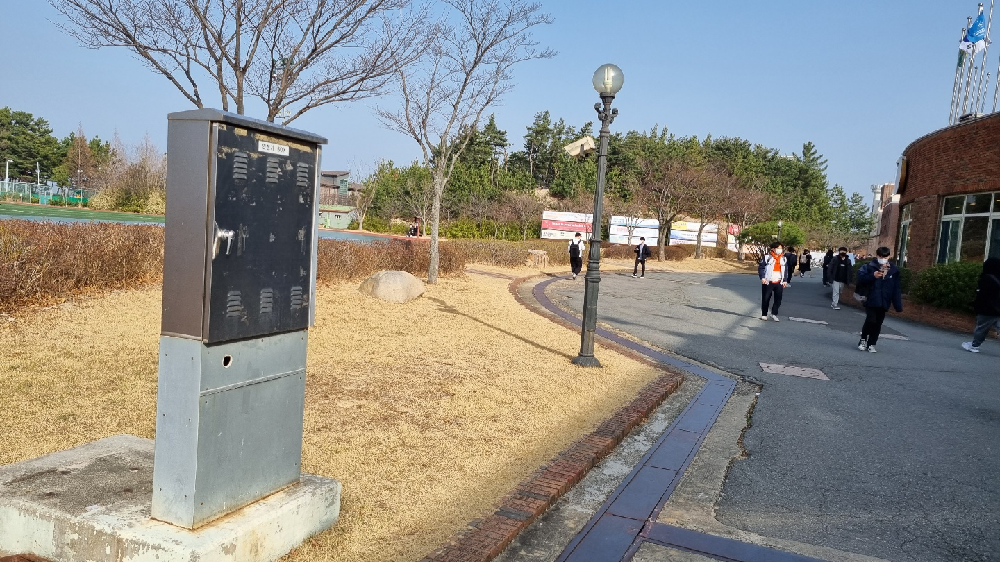

In [11]:
im

In [12]:
image = transform(im).unsqueeze(0) # batch_size 추가
out = model(image) # image

In [13]:
image.shape # (1,3, 800, 1422)

torch.Size([1, 3, 800, 1422])

In [14]:
out

{'pred_logits': tensor([[[-12.1592,   7.8200,  -1.3253,  ..., -12.2194, -12.8082,   6.5351],
          [-12.1660,   6.5053,  -1.9007,  ..., -12.2850, -12.9441,   6.3436],
          [-14.5653,   0.3892,  -5.6094,  ..., -14.7675, -14.0477,   8.8506],
          ...,
          [-13.6313,   1.6277,  -6.2584,  ..., -13.7419, -14.0608,   8.6021],
          [-14.1499,  -0.4342,  -5.7015,  ..., -13.9293, -14.4522,   9.5333],
          [-14.4608,   0.4278,  -5.3881,  ..., -14.2438, -14.6702,   9.5391]]],
        grad_fn=<SelectBackward>),
 'pred_boxes': tensor([[[0.7908, 0.4637, 0.0112, 0.0487],
          [0.8410, 0.4711, 0.0143, 0.0511],
          [0.6032, 0.3760, 0.5808, 0.1957],
          [0.2988, 0.4620, 0.5958, 0.2227],
          [0.5814, 0.8200, 0.3170, 0.3558],
          [0.7760, 0.4790, 0.0259, 0.0572],
          [0.8582, 0.4639, 0.0151, 0.0307],
          [0.8795, 0.4759, 0.0181, 0.0345],
          [0.5000, 0.4989, 0.9983, 0.9982],
          [0.8039, 0.4672, 0.0125, 0.0556],
          [

In [15]:
out["pred_logits"]

tensor([[[-12.1592,   7.8200,  -1.3253,  ..., -12.2194, -12.8082,   6.5351],
         [-12.1660,   6.5053,  -1.9007,  ..., -12.2850, -12.9441,   6.3436],
         [-14.5653,   0.3892,  -5.6094,  ..., -14.7675, -14.0477,   8.8506],
         ...,
         [-13.6313,   1.6277,  -6.2584,  ..., -13.7419, -14.0608,   8.6021],
         [-14.1499,  -0.4342,  -5.7015,  ..., -13.9293, -14.4522,   9.5333],
         [-14.4608,   0.4278,  -5.3881,  ..., -14.2438, -14.6702,   9.5391]]],
       grad_fn=<SelectBackward>)

In [16]:
out["pred_logits"].shape # (1,100,251) # 251 is classes

torch.Size([1, 100, 251])

In [17]:
# compute the scores, excluding the "no-object" class (the last one)
scores = out["pred_logits"].softmax(-1)[..., :-1].max(-1)[0]

# threshold the confidence
keep = scores > 0.85

In [18]:
keep # (1,100)

tensor([[False, False, False, False, False, False, False, False, False,  True,
          True,  True, False,  True, False, False, False, False, False, False,
         False, False, False,  True, False, False, False, False, False, False,
         False, False, False, False, False,  True,  True, False,  True, False,
         False, False, False, False, False, False, False, False, False, False,
         False, False,  True, False, False, False, False, False,  True, False,
          True,  True,  True, False, False,  True, False,  True,  True, False,
         False, False, False,  True,  True, False,  True,  True, False,  True,
          True, False,  True, False, False,  True, False, False,  True, False,
         False, False, False, False, False, False, False, False, False, False]])

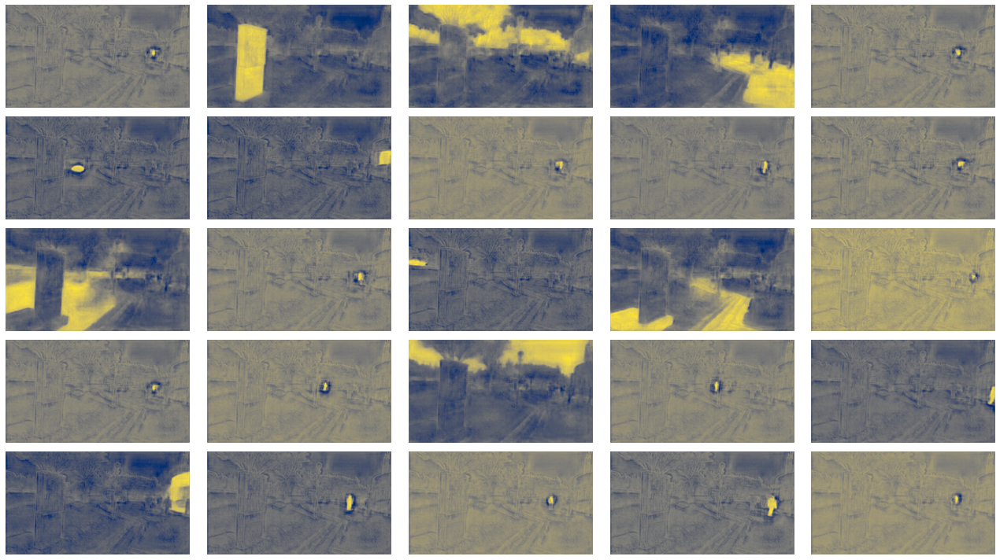

In [19]:
# Plot all the remaining masks
ncols = 5
fig, axs = plt.subplots(ncols=ncols, nrows=math.ceil(keep.sum().item() / ncols), figsize=(18, 10))
for line in axs:
    for a in line:
        a.axis('off')

# 기울기 문제로, 학습 안되도록 설정
with torch.no_grad():
    for i, mask in enumerate(out["pred_masks"][keep]):
        ax = axs[i // ncols, i % ncols]
        ax.imshow(mask, cmap="cividis")
        ax.axis('off')
    fig.tight_layout()
    
# 25개가 분류됨

In [20]:
postprocessor(out, torch.as_tensor(image.shape[-2:]).unsqueeze(0))

C:\Users\Admin\anaconda3\envs\tensorflow2_py38\lib\site-packages\torch\nn\functional.py:3451: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn(


[{'png_string': b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x05\x8e\x00\x00\x03 \x08\x02\x00\x00\x00\x0b6a\x1e\x00\x00B\xbaIDATx\x9c\xed\xdd\xebv\x1cE\x9a\xa8\xe1\x94e\x1a\xec\x05ny\x9a\xb9\xff\x0b\xdc\xf4\xc6\xb8{cf@\xed\xfd\xa3PQ\xaaCV\x1e\xe2\xf0E\xc4\xf3,/\x96,d)T\x92*3_ED><M\xa3\xf8\\{\x00\x00@L\x1fj\x0f\x00\x008\xf5\xa6\xf6\x00\x00\x00\x00\x00\xfe"U\x00\x00\x00\x00\x81H\x15\x00\xc0\xd0\xac\xfe\x00\x80hFI\x156\xaa\x00\x00\x00\x80&\x8c\x92*\x00\x00\x00\x80&H\x15\x00\x00\x00@ \xa3\xa4\n\xcbP\x01\x00\x00\xa0\t\xa3\xa4\n\x00\x80K~\x99\x01\x00\x01I\x15\x00\x00\x00@ \x03\xa5\n\xbf6\x01\x00\x00\x80\xf8\x06J\x15\x93Z\x01\x00\x00\x00\xe1\x8d\x95*\x00\x00N}\xae=\x00\x00\xe0\xd2p\xa9\xc2\xc4\n\x00\x00\x00\x88l\xb8T1\xa9\x15\x00\x00\x00\x10\xd8\x88\xa9bR+\x00\x00\x00 \xaaAS\xc5\xa4V\x00\x00\xd34\xd9\xae\x02\x00\xe2\x197ULj\x05\x00\x00\x00\xc43t\xaa\x98\xd4\n\x00\xc0\xc4\n\x00\x08f\xf4T\x01\x000M\xd3g\xc1\x02\x00\xc2\x90*L\xac\x00\x00\xfe$X\x00@\x04\x0fO\xb5G\x10\x84\xf3\x12\x00\xe0\x8c\xdfg

In [21]:
result = postprocessor(out, torch.as_tensor(image.shape[-2:]).unsqueeze(0))[0]
result

{'png_string': b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x05\x8e\x00\x00\x03 \x08\x02\x00\x00\x00\x0b6a\x1e\x00\x00B\xbaIDATx\x9c\xed\xdd\xebv\x1cE\x9a\xa8\xe1\x94e\x1a\xec\x05ny\x9a\xb9\xff\x0b\xdc\xf4\xc6\xb8{cf@\xed\xfd\xa3PQ\xaaCV\x1e\xe2\xf0E\xc4\xf3,/\x96,d)T\x92*3_ED><M\xa3\xf8\\{\x00\x00@L\x1fj\x0f\x00\x008\xf5\xa6\xf6\x00\x00\x00\x00\x00\xfe"U\x00\x00\x00\x00\x81H\x15\x00\xc0\xd0\xac\xfe\x00\x80hFI\x156\xaa\x00\x00\x00\x80&\x8c\x92*\x00\x00\x00\x80&H\x15\x00\x00\x00@ \xa3\xa4\n\xcbP\x01\x00\x00\xa0\t\xa3\xa4\n\x00\x80K~\x99\x01\x00\x01I\x15\x00\x00\x00@ \x03\xa5\n\xbf6\x01\x00\x00\x80\xf8\x06J\x15\x93Z\x01\x00\x00\x00\xe1\x8d\x95*\x00\x00N}\xae=\x00\x00\xe0\xd2p\xa9\xc2\xc4\n\x00\x00\x00\x88l\xb8T1\xa9\x15\x00\x00\x00\x10\xd8\x88\xa9bR+\x00\x00\x00 \xaaAS\xc5\xa4V\x00\x00\xd34\xd9\xae\x02\x00\xe2\x197ULj\x05\x00\x00\x00\xc43t\xaa\x98\xd4\n\x00\xc0\xc4\n\x00\x08f\xf4T\x01\x000M\xd3g\xc1\x02\x00\xc2\x90*L\xac\x00\x00\xfe$X\x00@\x04\x0fO\xb5G\x10\x84\xf3\x12\x00\xe0\x8c\xdfg\

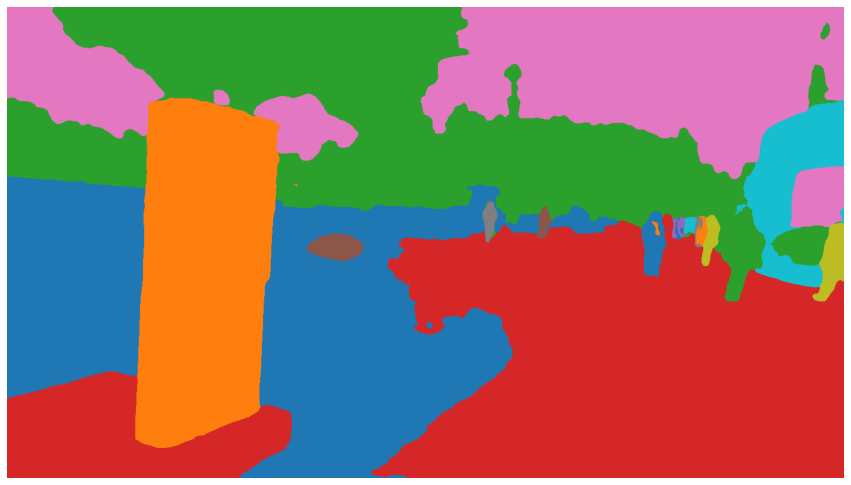

In [22]:
import itertools
import seaborn as sns
import io
palette = itertools.cycle(sns.color_palette())

# The segmentation is stored in a special-format png
panoptic_seg = Image.open(io.BytesIO(result['png_string']))
panoptic_seg = np.array(panoptic_seg, dtype=np.uint8).copy()

# 색깔 구성을 id로 바꾸기
panoptic_seg_id = rgb2id(panoptic_seg)

# id가 동일한 것 끼리 동일한 색상 부여
panoptic_seg[:, :, :] = 0
for id in range(panoptic_seg_id.max() + 1):
    panoptic_seg[panoptic_seg_id == id] = np.asarray(next(palette)) * 255
plt.figure(figsize=(15,15))
plt.imshow(panoptic_seg)
plt.axis('off')
plt.show()

# Detectron2 사용해서 Visualization 효과 높이기

1. https://github.com/facebookresearch/detectron2  
2. 마찬가지로, DETR과 같은 Object-detection model인데, 이 module안에 있는 visualize를 사용해서 좀 더 효과적으로 표현하고자 함.  

In [23]:
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

In [24]:
from copy import deepcopy
# segmentation 정보를 뽑아내기 (DETR이 예측한 값으로)
segments_info = deepcopy(result["segments_info"])

In [25]:
# Panoptic predictions are stored in a special format png
panoptic_seg = Image.open(io.BytesIO(result['png_string']))
final_w, final_h = panoptic_seg.size
# We convert the png into an segment id map
panoptic_seg = np.array(panoptic_seg, dtype=np.uint8)
panoptic_seg = torch.from_numpy(rgb2id(panoptic_seg))

In [26]:
# Detectron2 uses a different numbering of coco classes, here we convert the class ids accordingly
meta = MetadataCatalog.get("coco_2017_val_panoptic_separated")
for i in range(len(segments_info)):
    c = segments_info[i]["category_id"]
    segments_info[i]["category_id"] = meta.thing_dataset_id_to_contiguous_id[c] if segments_info[i]["isthing"] else meta.stuff_dataset_id_to_contiguous_id[c]

In [28]:
meta

namespace(name='coco_2017_val_panoptic_separated',
          panoptic_root='datasets\\coco/panoptic_val2017',
          image_root='datasets\\coco/val2017',
          panoptic_json='datasets\\coco/annotations/panoptic_val2017.json',
          sem_seg_root='datasets\\coco/panoptic_stuff_val2017',
          json_file='datasets\\coco/annotations/instances_val2017.json',
          evaluator_type='coco_panoptic_seg',
          ignore_label=255,
          stuff_dataset_id_to_contiguous_id={92: 1,
                                             93: 2,
                                             95: 3,
                                             100: 4,
                                             107: 5,
                                             109: 6,
                                             112: 7,
                                             118: 8,
                                             119: 9,
                                             122: 10,
                            

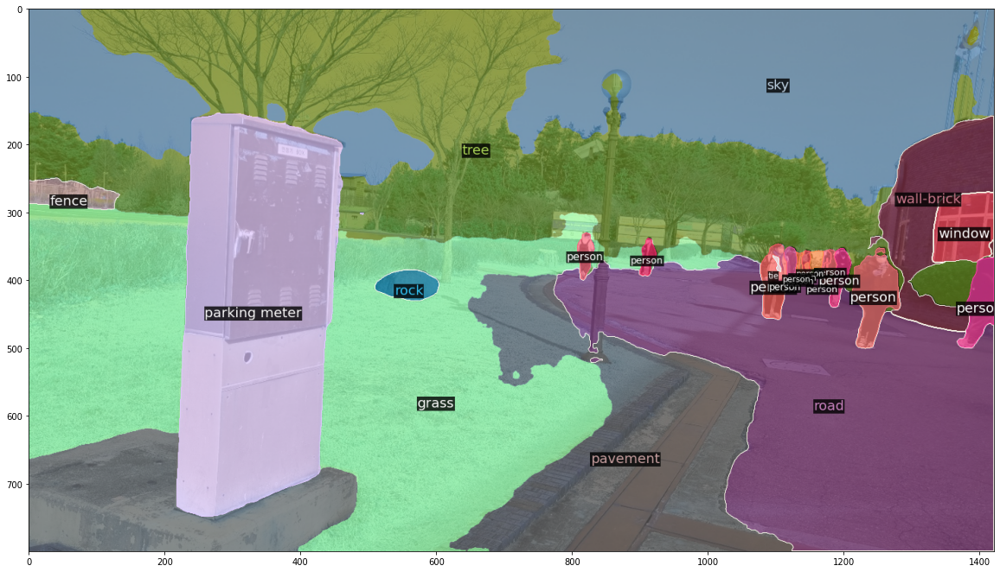

In [28]:
# Finally we visualize the prediction
v = Visualizer(numpy.array(im.copy().resize((final_w, final_h)))[:, :, ::-1], meta, scale=1.0)
v._default_font_size = 20
v = v.draw_panoptic_seg_predictions(panoptic_seg, segments_info, area_threshold=0)
plt.figure(figsize=(20,20))
plt.imshow(v.get_image())

# 자동차와 나무 사진

In [29]:
img2 = './handong_place2.jpg'
img2 = Image.open(img2)

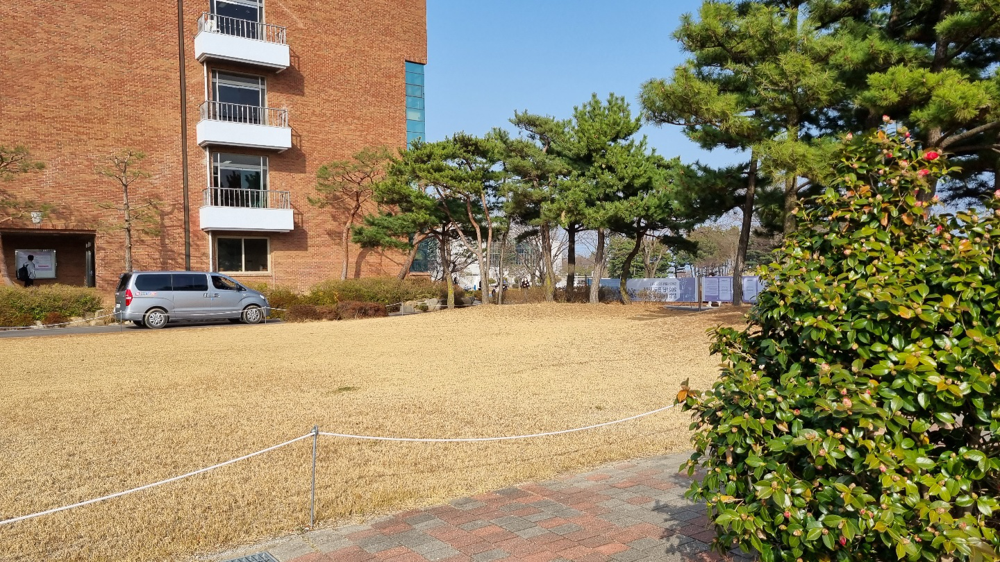

In [30]:
img2

In [31]:
image2 = transform(img2).unsqueeze(0)

In [32]:
out2 = model(image2)

In [33]:
out2

{'pred_logits': tensor([[[-15.6451,  -3.2236,  -9.9261,  ..., -15.8421, -15.4129,  11.1102],
          [-14.7954,  -1.8566,  -9.9519,  ..., -14.9400, -15.0354,   9.4761],
          [-15.7026,  -2.4129,  -7.8198,  ..., -16.1553, -15.7019,  11.1566],
          ...,
          [-15.7647,  -1.3751,  -8.1083,  ..., -16.1668, -15.8002,  10.9152],
          [ -9.9510,   2.2189,  -1.9372,  ..., -10.7912, -10.8712,   5.0386],
          [-15.1172,  -1.4857,  -7.4919,  ..., -15.5988, -15.6390,  10.6246]]],
        grad_fn=<SelectBackward>),
 'pred_boxes': tensor([[[0.6102, 0.4872, 0.2877, 0.0981],
          [0.7138, 0.5091, 0.0948, 0.0648],
          [0.5029, 0.4693, 0.5233, 0.1735],
          [0.2170, 0.2662, 0.4328, 0.5327],
          [0.2581, 0.9837, 0.0559, 0.0282],
          [0.4716, 0.8687, 0.5191, 0.2571],
          [0.7623, 0.4362, 0.0464, 0.0535],
          [0.0700, 0.5774, 0.1377, 0.0477],
          [0.5000, 0.4986, 0.9985, 0.9975],
          [0.6452, 0.5101, 0.0976, 0.0547],
          [

In [34]:
out2['pred_logits'].shape # (1,100,251)

torch.Size([1, 100, 251])

In [35]:
scores = out2['pred_logits'].softmax(-1)[..., :-1].max(-1)[0]
keep = scores > 0.85

In [36]:
keep.shape # (1,100)

torch.Size([1, 100])

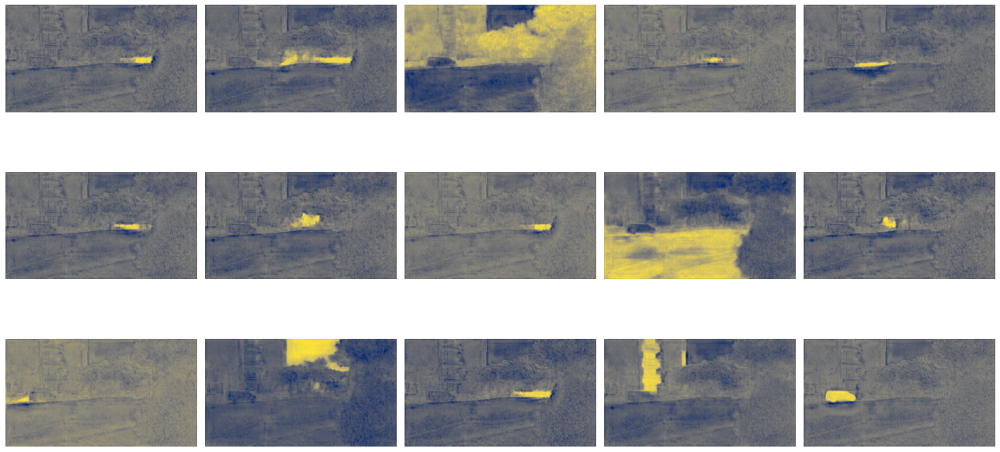

In [52]:
# Plot all the remaining masks
ncols = 5
fig, axs = plt.subplots(ncols=ncols, nrows=math.ceil(keep.sum().item() / ncols), figsize=(18, 10))
for line in axs:
    for a in line:
        a.axis('off')

# 기울기 문제로, 학습 안되도록 설정
with torch.no_grad():
    for i, mask in enumerate(out2["pred_masks"][keep]):
        ax = axs[i // ncols, i % ncols]
        ax.imshow(mask, cmap="cividis")
        ax.axis('off')
    fig.tight_layout()
    
# 15개 분류

In [38]:
result2 = postprocessor(out2, torch.as_tensor(image2.shape[-2:]).unsqueeze(0))[0]
result2

C:\Users\Admin\anaconda3\envs\tensorflow2_py38\lib\site-packages\torch\nn\functional.py:3451: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn(


{'png_string': b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x05\x8e\x00\x00\x03 \x08\x02\x00\x00\x00\x0b6a\x1e\x00\x00(\xf8IDATx\x9c\xed\xdd\xdbv\xdbF\x12@QP\x92\xf3\xff\xdf;v\xe4y`\xc2\xc8\x14\t\xe2\xd2\x97\xea\xea\xbd\xd7<d\x1cYiQ$\x84>*\x80\x97\x05(\xe7\xe3\xc9\x9f\xff\xfa\xf2\xcfo-\x16\x12\xd7\xe7\xb2,\xcf\x1f\xa8\x87~}\xfb\x93\x8fW\x1f\x00\xdb\xfd\xe8\xbd\x00\x80-~\xf6^\x00@K\x93o\x9a\x00\x00\x00\x80Xv\xfdj\x13\xa0\x80\xbd\xc7\x9d\x97\x1f\x7f\xfd\x00\xb3\x15\x00\x00\x90\x83\xa9\n(feG-\n^\xbd\xd5|(><\xce\x00\x00\x90\xc2\xa5\xf7\x02`0\xb7\xcd\xf0\xcb\x1b(\xdcq\xbb\x8a\xa5\xc7\x17n\xd4\x82-\xdc\xae\x02\x08\xce\x8d*\x80\xd9\x14\xfb\x1d\xe4\xd7Odo@V\x1fO\xfey\xe3\xdf\xf5\xd2h\xcf\r8\x01\x00`8\xd3\xfer\x17v;\x19\xf6l\x92\x1dn\x08\xcb\xaf+\x01\x00B)6Ua\x1b\xc6l\x1e>\xe7\x1f\xbe\xa2\xbe\x7f\xe4\xa7}{\'f[\x00\x18\x8e\x9c\nL\xc8M\xe8`\xab_\xab7\xaa\xf8\xfa\xe7\xde\x90\x02\x00\x00\xe00\xbf\xd9\x85\xdd^6\x88_:\x05\x8c\xc6/-\x01\x00\xe20U\x01;\x08\x10\x00@KB*0\'S\x15\xc0D\xc4&\x00\x00\x88\xcf

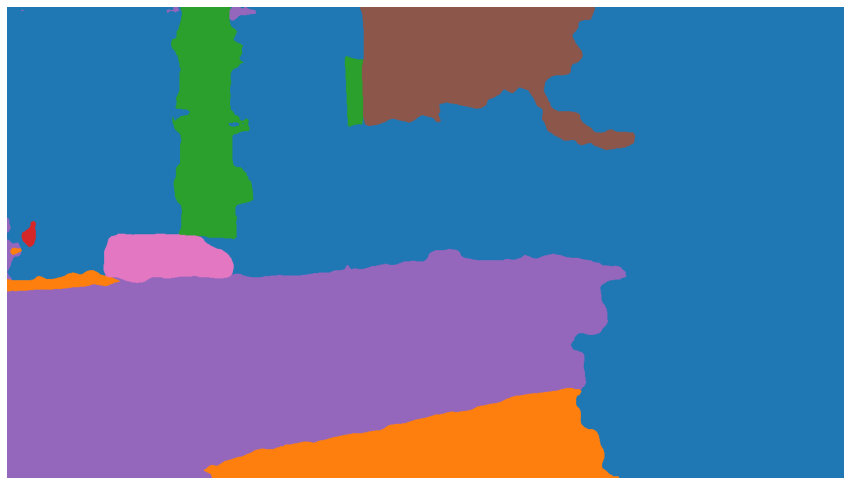

In [39]:
palette = itertools.cycle(sns.color_palette())

# The segmentation is stored in a special-format png
panoptic_seg2 = Image.open(io.BytesIO(result2['png_string']))
panoptic_seg2 = np.array(panoptic_seg2, dtype=np.uint8).copy()

# 색깔 구성을 id로 바꾸기
panoptic_seg_id2 = rgb2id(panoptic_seg2)

# id가 동일한 것 끼리 동일한 색상 부여
panoptic_seg2[:, :, :] = 0
for id in range(panoptic_seg_id2.max() + 1):
    panoptic_seg2[panoptic_seg_id2 == id] = np.asarray(next(palette)) * 255
plt.figure(figsize=(15,15))
plt.imshow(panoptic_seg2)
plt.axis('off')
plt.show()

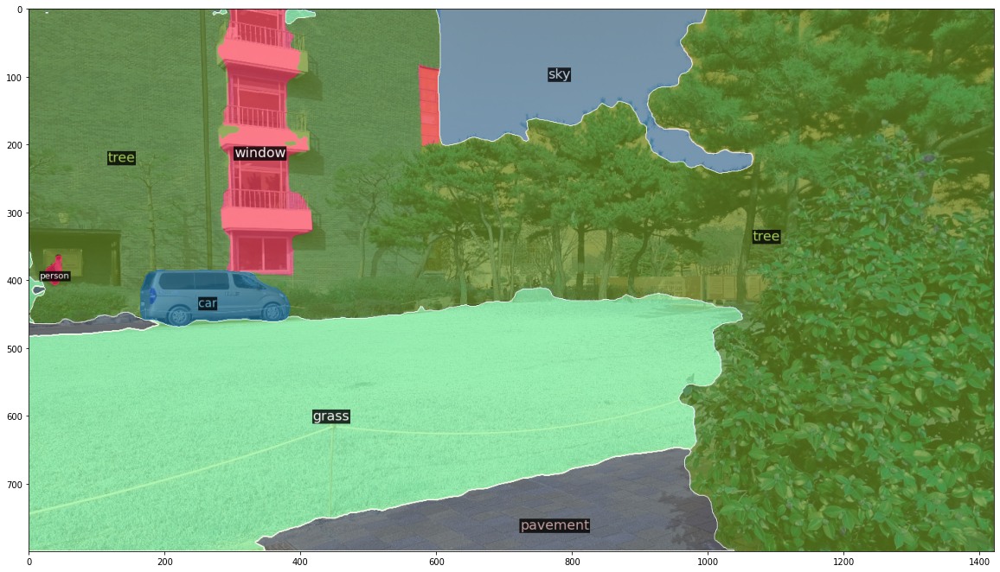

In [40]:
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from copy import deepcopy

# segmentation 정보를 뽑아내기 (DETR이 예측한 값으로)
segments_info2 = deepcopy(result2["segments_info"])

panoptic_seg2 = Image.open(io.BytesIO(result2['png_string']))
final_w, final_h = panoptic_seg2.size
panoptic_seg2 = np.array(panoptic_seg2, dtype=np.uint8)
panoptic_seg2 = torch.from_numpy(rgb2id(panoptic_seg2))

meta = MetadataCatalog.get("coco_2017_val_panoptic_separated")
for i in range(len(segments_info2)):
    c = segments_info2[i]["category_id"]
    segments_info2[i]["category_id"] = meta.thing_dataset_id_to_contiguous_id[c] if segments_info2[i]["isthing"] else meta.stuff_dataset_id_to_contiguous_id[c]
    
# Finally we visualize the prediction
v = Visualizer(numpy.array(img2.copy().resize((final_w, final_h)))[:, :, ::-1], meta, scale=1.0)
v._default_font_size = 20
v = v.draw_panoptic_seg_predictions(panoptic_seg2, segments_info2, area_threshold=0)
plt.figure(figsize=(20,20))
plt.imshow(v.get_image())    

# 넓은 평야와 전봇대

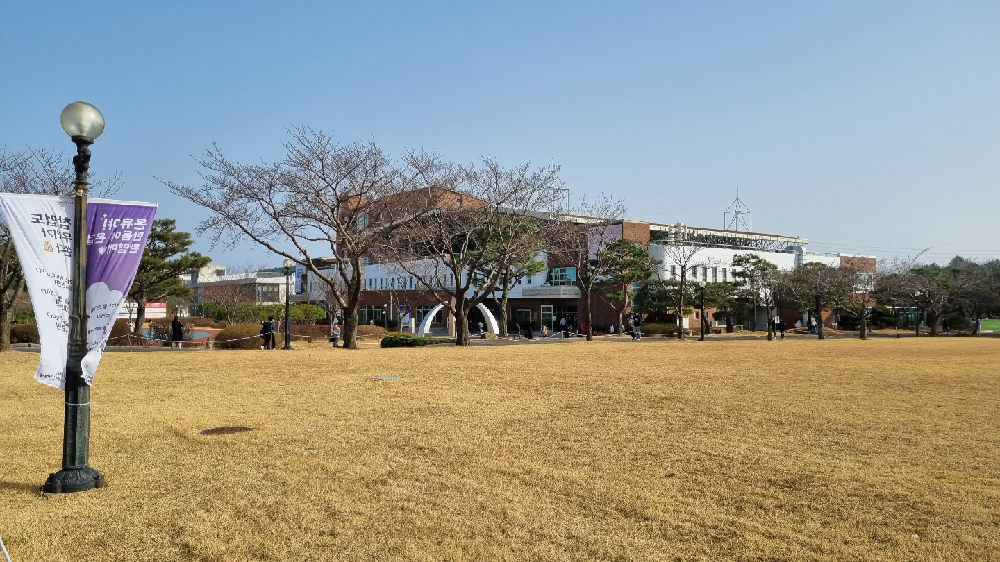

In [41]:
img3 = './handong_place3.jpg'
img3 = Image.open(img3)
img3

In [42]:
image3 = transform(img3).unsqueeze(0)
out3 = model(image3)

In [43]:
out3

{'pred_logits': tensor([[[-12.5842,   7.5269,   0.9460,  ..., -12.7463, -13.0908,   7.2376],
          [-11.0799,   8.5969,  -0.1516,  ..., -11.2773, -11.9049,   6.3385],
          [-13.5601,   2.5484,  -4.3306,  ..., -13.6573, -13.0427,   8.7245],
          ...,
          [-12.0452,   3.5921,  -1.1343,  ..., -12.1682, -12.7995,   6.6427],
          [-10.7909,  11.1255,   0.0187,  ..., -11.0562, -11.5943,   5.5860],
          [-14.7684,   1.5091,  -3.3116,  ..., -14.8085, -15.5617,   8.4486]]],
        grad_fn=<SelectBackward>),
 'pred_boxes': tensor([[[0.5767, 0.5798, 0.0106, 0.0323],
          [0.7762, 0.5836, 0.0105, 0.0438],
          [0.5260, 0.5012, 0.6895, 0.2279],
          [0.1934, 0.5889, 0.3734, 0.0861],
          [0.4503, 0.5946, 0.0280, 0.0277],
          [0.6018, 0.5921, 0.1767, 0.0474],
          [0.7948, 0.5796, 0.0147, 0.0369],
          [0.1494, 0.5962, 0.0411, 0.0268],
          [0.5000, 0.4831, 0.9982, 0.8779],
          [0.6150, 0.5813, 0.0089, 0.0269],
          [

In [44]:
scores = out3['pred_logits'].softmax(-1)[...,:-1].max(-1)[0]
keep = scores > 0.85

In [45]:
scores.shape # (1,100)

torch.Size([1, 100])

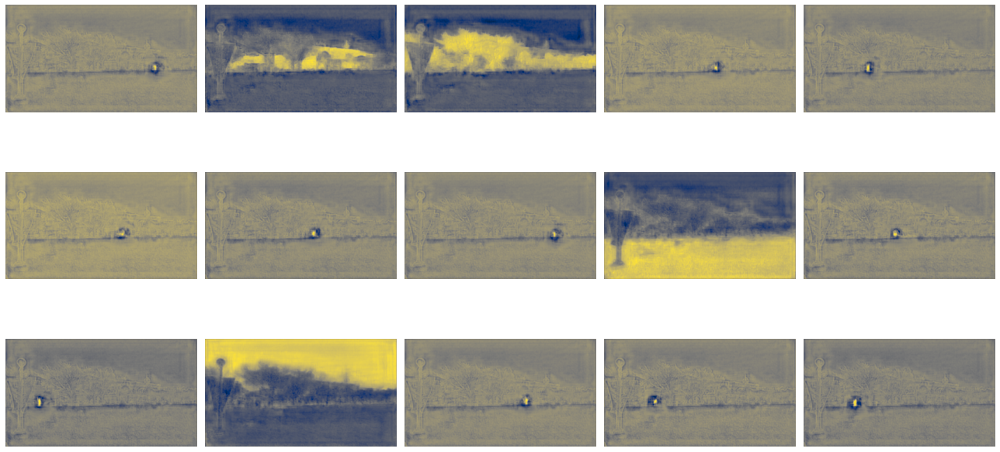

In [51]:
# Plot all the remaining masks
ncols = 5
fig, axs = plt.subplots(ncols=ncols, nrows=math.ceil(keep.sum().item() / ncols), figsize=(18, 10))
for line in axs:
    for a in line:
        a.axis('off')

# 기울기 문제로, 학습 안되도록 설정
with torch.no_grad():
    for i, mask in enumerate(out3["pred_masks"][keep]):
        ax = axs[i // ncols, i % ncols]
        ax.imshow(mask, cmap="cividis")
        ax.axis('off')
    fig.tight_layout()
    
# 15개 분류

In [47]:
result3 = postprocessor(out3, torch.as_tensor(image3.shape[-2:]).unsqueeze(0))[0]
result3

{'png_string': b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x05\x8e\x00\x00\x03 \x08\x02\x00\x00\x00\x0b6a\x1e\x00\x007\x12IDATx\x9c\xed\xdd\xed\x92\xdb\xb8\xa1\xaeQu\xc6\xe9\xc4\x93\xdc\xff\x95\xee\x1ag{\xc7\xf1\xf9\xa13\x8a\xac\x0f\x8a"A\xe0\x05\xb0VMM\xf9\xb3MQ\x14I<\r\x92\x1f\xff8\x01\x00\x00\x00\xa4\xf8K\xeb\x05\x00\x00\x00\x00\xf8/\xa9\x02\x00\x00\x00\x08"U\x00\x00\x00\x00A\xa4\n\x00\x00\x00 \x88T\x01\x00\x00\x00\x04\x91*\x00\x00\x00\x80 R\x05\x00\x00\x00\x10D\xaa\x00\x00\x00\x00\x82H\x15\x00\x00\x00@\x10\xa9\x02\x00\x00\x00\x08"U\x00\x00\x00\x00A\xa4\n\x00\x00\x00 \x88T\x01\x00\x00\x00\x04\x91*\x00\x00\x00\x80 R\x05\x00\x00\x00\x10D\xaa\x00\x00\x00\x00\x82H\x15\x00\x00\x00@\x10\xa9\x02\x00\x00\x00\x08"U\x00\x00\x00\x00A\xa4\n\x00\x00\x00 \x88T\x01\x00\x00\x00\x04\x91*\x00\x00\x00\x80 R\x05\x00\x00\x00\x10D\xaa\x00\x00\x00\x00\x82H\x15\x00\x00\x00@\x10\xa9\x02\x00\x00\x00\x08"U\x00\x00\x00\x00A\xa4\n\x00\x00\x00 \x88T\x01\x00\x00\x00\x04\x91*\x00\x00\x00\x80 R\x05\x00\x00\x00\x1

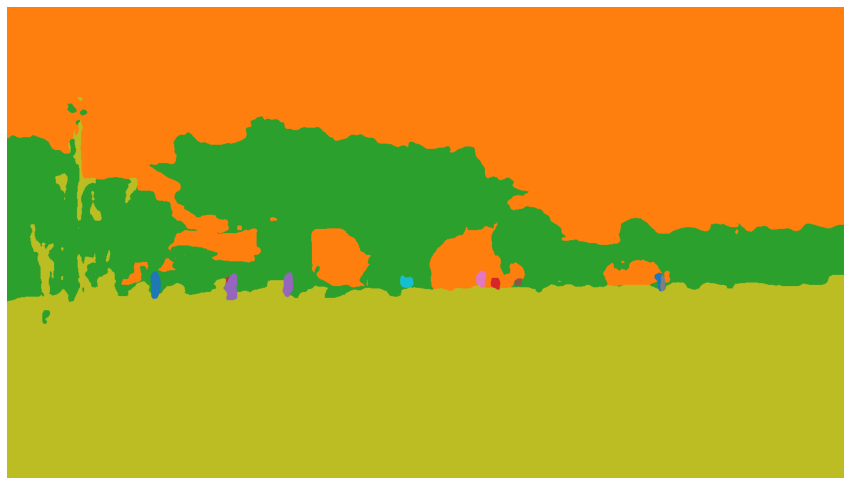

In [49]:
palette = itertools.cycle(sns.color_palette())

panotic_seg3 = Image.open(io.BytesIO(result3['png_string']))
panotic_seg3 = np.array(panotic_seg3, dtype=np.uint8()).copy()

panotic_id3 = rgb2id(panotic_seg3)

panotic_seg3[:,:,:] = 0

for id in range(panotic_id3.max()+1):
    panotic_seg3[id==panotic_id3] = np.asarray(next(palette)) * 255

plt.figure(figsize=(15,15))
plt.imshow(panotic_seg3)
plt.axis('off')
plt.show()

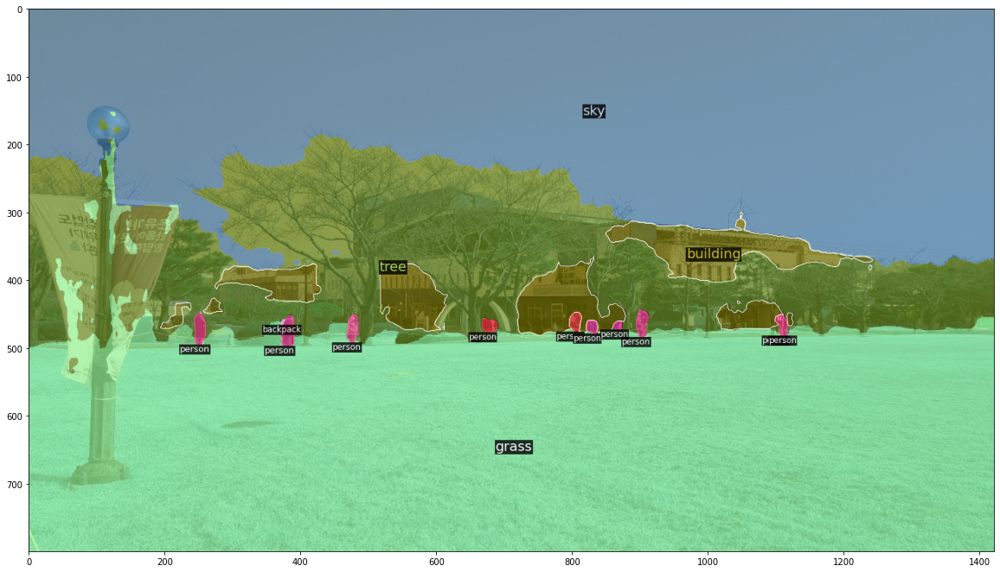

In [50]:
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from copy import deepcopy

# segmentation 정보를 뽑아내기 (DETR이 예측한 값으로)
segments_info3 = deepcopy(result3["segments_info"])

panoptic_seg3 = Image.open(io.BytesIO(result3['png_string']))
final_w, final_h = panoptic_seg3.size
panoptic_seg3 = np.array(panoptic_seg3, dtype=np.uint8)
panoptic_seg3 = torch.from_numpy(rgb2id(panoptic_seg3))

meta = MetadataCatalog.get("coco_2017_val_panoptic_separated")
for i in range(len(segments_info3)):
    c = segments_info3[i]["category_id"]
    segments_info3[i]["category_id"] = meta.thing_dataset_id_to_contiguous_id[c] if segments_info3[i]["isthing"] else meta.stuff_dataset_id_to_contiguous_id[c]
    
# Finally we visualize the prediction
v = Visualizer(numpy.array(img3.copy().resize((final_w, final_h)))[:, :, ::-1], meta, scale=1.0)
v._default_font_size = 20
v = v.draw_panoptic_seg_predictions(panoptic_seg3, segments_info3, area_threshold=0)
plt.figure(figsize=(20,20))
plt.imshow(v.get_image()) 